## Código a copiar:

In [22]:
# EXPORTAR: barras_apiladas

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import font_manager
from pathlib import Path
import matplotlib.ticker as mticker
from matplotlib.ticker import FuncFormatter
from statistics import mode
import subprocess
from matplotlib.patches import Patch
import os
    
def limpiar_svg_con_scour(archivo_entrada, archivo_salida):
    subprocess.run([
        'scour', '-i', archivo_entrada, '-o', archivo_salida,
        '--enable-viewboxing', '--enable-id-stripping',
        '--shorten-ids', '--remove-descriptive-elements'
    ], check=True)

def limpiar_svg_con_svgo(archivo_entrada, archivo_salida):
    subprocess.run(['svgo', archivo_entrada, '-o', archivo_salida], check=True)

def formato_fechas(fechas):
    fechas = pd.to_datetime(fechas)
    if len(set(f.year for f in fechas)) == len(fechas):
        return [str(f.year) for f in fechas]
    else:
        return [f.strftime("%d-%m-%Y") for f in fechas]

def get_text_color_for_bg(bg_color_hex):
    """Determina si el texto debe ser negro o blanco según el color de fondo hexadecimal."""
    try:
        hex_color = bg_color_hex.lstrip('#')
        if len(hex_color) != 6:
            return '#ffffff'
        r, g, b = tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))
        luminance = (0.299 * r + 0.587 * g + 0.114 * b) / 255
        return '#000000' if luminance > 0.6 else '#ffffff'
    except (ValueError, TypeError):
        return '#ffffff'

def barras(
    df_wide, 
    nombre=None,
    font='Montserrat',
    fontsize_barra=15, 
    fontsize_valor_total=20,
    bar_height=0.5, 
    aumenta_ancho_fig=0,
    aumenta_alto_fig=0,
    aumenta_sep_leyenda=0.0,
    valor_barra=False, 
    valor_total=True,
    porcentaje_barra=False, 
    porcentaje_total=False, 
    porcentaje_total_inicio=False,
    orientacion='horizontal',
    ordenar_por='valor',
    orden='descendente',
    quitar_capsula=False,
    area_min=0,
    espacio_inicio=0,
    paleta_colores=None,
    color_valor_barra=None,
    agregar_datos=None,
    asignar_etiquetas=None,
    grillas=True,
    leyenda=None,
    posicion_leyenda='arriba',
    union_izquierda=0,
    union_derecha=0,       
    sustituir_etiquetas=None,
    separar_por_total=0.0,
    y_limits=None,
    nombre_eje_x=None,
    nombre_eje_y=None,
    resaltar_etiquetas=None,
    porcentaje_abajo=True,
    orientacion_etiqueta_x=None,
    altura_min=0
):

    hay_annotations_externas = False
    espacio = "\u00A0"

    font_config = {
        'family': font,
        'variable_x': {'size': 25, 'weight': 'medium', 'color': '#000000'},
        'variable_y': {'size': 22, 'weight': 'medium', 'color': '#000000'},
        'nombre_eje_x': {'size': 25, 'weight': 'medium', 'color': '#000000'},
        'nombre_eje_y': {'size': 22, 'weight': 'medium', 'color': '#000000'},
        'valor_capsula': {'size': fontsize_valor_total, 'weight': 'bold', 'color': '#000000'},
        'valor_porcentaje_barra': {'size': fontsize_barra, 'weight': 'bold', 'color': '#584290'},
        'porcentaje_total': {'size': 22, 'weight': 'semibold', 'color': '#4C6A67'},
        'leyenda': {'size': 24, 'weight': 'medium', 'color': '#767676'}
    }

    plt.rcParams['svg.fonttype'] = 'none'
    font_dirs = [Path("../0_fonts")]
    font_files = font_manager.findSystemFonts(fontpaths=font_dirs)
    for font_file in font_files:
        font_manager.fontManager.addfont(font_file)

    nombre_df = nombre or "barras_apiladas"
    if paleta_colores:
        colores_asignados = paleta_colores
    else:
        colores_asignados = ["#10302C", "#4C6A67", "#8FA8A6", "#A3C9A8"]

    if isinstance(df_wide, pd.DataFrame):
        df_wide = df_wide.copy()
        categorias_x = df_wide.columns[0]
        if (
            pd.api.types.is_integer_dtype(df_wide[categorias_x])
            and df_wide[categorias_x].between(1900, 2100).all()
        ):
            df_wide[categorias_x] = df_wide[categorias_x].apply(lambda x: pd.Timestamp(x, 1, 1))
        df_wide = df_wide.set_index(categorias_x)
    else:
        raise ValueError("El argumento df_wide debe ser un DataFrame de pandas.")

    etiqueta_union_izq = "Unión"
    if union_izquierda > 1 and len(df_wide) >= union_izquierda:
        union = df_wide.iloc[:union_izquierda].sum()
        idxs = df_wide.index[:union_izquierda]
        if np.issubdtype(type(idxs[0]), np.datetime64) or isinstance(idxs[0], pd.Timestamp):
            etiqueta_union_izq = f"{idxs[0].year}-{idxs[-1].year}"
        elif isinstance(idxs[0], (int, np.integer, float)):
            etiqueta_union_izq = f"{idxs[0]}-{idxs[-1]}"
        else:
            etiqueta_union_izq = f"{idxs[0]}-{idxs[-1]}"
        df_wide = pd.concat([
            pd.DataFrame([union], index=[etiqueta_union_izq]),
            df_wide.iloc[union_izquierda:]
        ])

    etiqueta_union_der = "Unión"
    if union_derecha > 1 and len(df_wide) >= union_derecha:
        union = df_wide.iloc[-union_derecha:].sum()
        idxs = df_wide.index[-union_derecha:]
        if np.issubdtype(type(idxs[0]), np.datetime64) or isinstance(idxs[0], pd.Timestamp):
            etiqueta_union_der = f"{idxs[0].year}-{idxs[-1].year}"
        elif isinstance(idxs[0], (int, np.integer, float)):
            etiqueta_union_der = f"{idxs[0]}-{idxs[-1]}"
        else:
            etiqueta_union_der = f"{idxs[0]}-{idxs[-1]}"
        df_wide = pd.concat([
            df_wide.iloc[:-union_derecha],
            pd.DataFrame([union], index=[etiqueta_union_der])
        ])

    df_wide = df_wide.copy()
    etiquetas_personalizadas = {}
    if agregar_datos is not None:
        filas_extra = []
        for item in agregar_datos:
            if len(item) == 3:
                categoria, etiqueta, valor = item
                etiquetas_personalizadas[categoria] = etiqueta
            else:
                categoria, valor = item
                etiqueta = None
            if isinstance(valor, (list, tuple, np.ndarray)):
                fila = dict(zip(df_wide.columns, valor))
            else:
                fila = {col: valor if i == 0 else 0 for i, col in enumerate(df_wide.columns)}
            filas_extra.append(pd.Series(fila, name=categoria))
        df_wide = pd.concat([pd.DataFrame(filas_extra), df_wide])

    if agregar_datos is not None:
        if isinstance(df_wide.index[0], (int, np.integer, str)):
            categoria_espaciadora = "__espaciador__"
        else:
            fechas_agregar = [d[0] for d in agregar_datos]
            fecha_max_agregar = max(fechas_agregar)
            fechas_resto = [idx for idx in df_wide.index[len(agregar_datos):] if isinstance(idx, pd.Timestamp)]
            if fechas_resto:
                fecha_min_resto = min(fechas_resto)
                categoria_espaciadora = fecha_max_agregar + (fecha_min_resto - fecha_max_agregar) / 2
            else:
                categoria_espaciadora = fecha_max_agregar + pd.Timedelta(days=1)
        fila_espaciadora = pd.Series({col: 0 for col in df_wide.columns}, name=categoria_espaciadora)
        n_agregar = len(agregar_datos)
        df_wide = pd.concat([
            df_wide.iloc[:n_agregar],
            pd.DataFrame([fila_espaciadora]),
            df_wide.iloc[n_agregar:]
        ])

    etiquetas_finales = None
    if asignar_etiquetas is not None and asignar_etiquetas in df_wide.columns:
        etiquetas_finales = df_wide[asignar_etiquetas].copy()
        df_wide = df_wide.drop(columns=[asignar_etiquetas])        

    suma_total = df_wide.sum(axis=1)
    total_general = suma_total.sum()
    
    x_max_pos = df_wide[df_wide > 0].sum(axis=1).max()
    x_max_neg = df_wide[df_wide < 0].sum(axis=1).min()
    x_max = max(x_max_pos, abs(x_max_neg)) * 1.15
    if pd.isna(x_max): x_max = suma_total.max() * 1.15

    sort_index = df_wide.index
    if ordenar_por == 'valor':
        sort_index = suma_total.sort_values(ascending=(orden == 'ascendente')).index
    elif ordenar_por == 'etiqueta':
        indices = list(df_wide.index)
        izq = []
        der = []
        centro = indices.copy()
        if union_izquierda > 1:
            izq = [etiqueta_union_izq]
            centro = [i for i in centro if i != etiqueta_union_izq]
        if union_derecha > 1:
            der = [etiqueta_union_der]
            centro = [i for i in centro if i != etiqueta_union_der]
        tipos = set(type(idx) for idx in centro)
        if len(tipos) > 1:
            centro_ordenado = sorted(centro, key=lambda x: str(x), reverse=(orden == 'descendente'))
        else:
            centro_ordenado = sorted(centro, reverse=(orden == 'descendente'))
        sort_index = izq + centro_ordenado + der

    df_wide = df_wide.loc[sort_index]
    suma_total = suma_total.loc[sort_index]
    entidades = df_wide.index.values

    indices_fechas = [
        i for i, idx in enumerate(df_wide.index)
        if isinstance(idx, (pd.Timestamp, np.datetime64))
    ]
    if indices_fechas:
        fechas_formateadas = formato_fechas([df_wide.index[i] for i in indices_fechas])
    else:
        fechas_formateadas = []

    entidades_formateadas = []
    fecha_idx = 0
    for i, idx in enumerate(df_wide.index):
        if (union_izquierda > 1 and idx == etiqueta_union_izq) or (union_derecha > 1 and idx == etiqueta_union_der):
            entidades_formateadas.append(idx)
        elif isinstance(idx, (pd.Timestamp, np.datetime64)):
            entidades_formateadas.append(fechas_formateadas[fecha_idx])
            fecha_idx += 1
        else:
            entidades_formateadas.append(str(idx))

    es_fecha = any(
        isinstance(idx, (pd.Timestamp, np.datetime64))
        for idx in df_wide.index
        if not (
            (union_izquierda > 1 and idx == etiqueta_union_izq) or
            (union_derecha > 1 and idx == etiqueta_union_der)
        )
    )

    if sustituir_etiquetas is not None:
        if len(sustituir_etiquetas) != len(entidades_formateadas):
            raise ValueError("La longitud de 'sustituir_etiquetas' debe coincidir con el número de barras.")
        entidades_formateadas = list(sustituir_etiquetas)

    if etiquetas_personalizadas:
        for i, entidad in enumerate(df_wide.index):
            if entidad in etiquetas_personalizadas and etiquetas_personalizadas[entidad] is not None:
                entidades_formateadas[i] = etiquetas_personalizadas[entidad]

    if agregar_datos is not None:
        if es_fecha:
            fechas_agregar = [d[0] for d in agregar_datos]
            fechas_todas = list(df_wide.index)
            fechas_resto = [idx for idx in fechas_todas if idx not in fechas_agregar]
            anio_espaciador = None
            for idx in fechas_resto:
                if (df_wide.loc[idx] == 0).all():
                    anio_espaciador = idx
                    break
            for i, entidad in enumerate(df_wide.index):
                if entidad == anio_espaciador:
                    entidades_formateadas[i] = "..."
        else:
            for i, entidad in enumerate(entidades_formateadas):
                if entidad == "__espaciador__":
                    entidades_formateadas[i] = "..."

    valores = [df_wide[col].values for col in df_wide.columns]
    categorias = df_wide.columns
    posiciones = np.arange(len(entidades))

    if agregar_datos is not None:
        for i, entidad in enumerate(entidades_formateadas):
            if entidad == "__espaciador__":
                entidades_formateadas[i] = "..."

    if orientacion == 'vertical':
        longitudes = []
        for total_valor in suma_total:
            texto_capsula = f"{espacio*4}{int(total_valor):,}{espacio*4}"
            longitudes.append(len(texto_capsula))
        if longitudes:
            moda_capsula_len = mode(longitudes)
        else:
            moda_capsula_len = 10
        extra_width = moda_capsula_len * 0.1
        base_width = max(12, len(entidades)*extra_width)
        fig_width = base_width + aumenta_ancho_fig
        fig_height = 8 + aumenta_alto_fig
        fig, ax = plt.subplots(figsize=(fig_width, fig_height), dpi=300)
    else:
        fig_width = 12 + aumenta_ancho_fig          
        fig_height = 15 + aumenta_alto_fig                 
        fig, ax = plt.subplots(figsize=(fig_width, fig_height), dpi=300)

    fig.patch.set_alpha(0)
    ax.patch.set_alpha(0)

    for pos, entidad, total_valor in zip(posiciones, entidades, suma_total):
        left_pos = 0
        left_neg = 0
        annotations_externas = []
        for i, valor in enumerate(valores):
            color = colores_asignados[i % len(colores_asignados)]
            if color_valor_barra:
                text_color_interior = color_valor_barra
            else:
                text_color_interior = get_text_color_for_bg(color)
            label = categorias[i] if pos == 0 else None
            current_val = valor[pos]

            if orientacion == 'horizontal':
                bar_left = 0
                if current_val > 0:
                    bar_left = left_pos
                    left_pos += current_val
                elif current_val < 0:
                    bar_left = left_neg
                    left_neg += current_val

                if current_val != 0:
                    ax.barh(pos, current_val, height=bar_height, left=bar_left, color=color, edgecolor='none', zorder=2, label=label)
                    area_barra = abs(current_val) * bar_height
                    if (porcentaje_barra or valor_barra) and area_barra >= area_min:
                        porcentaje_valor = (current_val / total_valor) * 100 if total_valor != 0 else 0
                        
                        text_pos_x = bar_left + current_val / 2
                        
                        if altura_min > 0 and abs(current_val) < altura_min:
                            if i == len(valores) - 1:
                                hay_annotations_externas = True
                            texto = ""
                            if valor_barra and porcentaje_barra:
                                texto = f"{current_val:,.0f} ({porcentaje_valor:.1f}%)"
                            elif valor_barra:
                                texto = f"{current_val:,.0f}"
                            elif porcentaje_barra:
                                texto = f"{porcentaje_valor:.1f}%"
                            annotations_externas.append({
                                'text': texto, 'y_center': pos, 'x_center': text_pos_x
                            })
                        else:
                            texto_final = ""
                            if valor_barra and porcentaje_barra:
                                texto_final = f"{current_val:,.0f} ({porcentaje_valor:.1f}%)" if not porcentaje_abajo else f"{current_val:,.0f}\n{porcentaje_valor:.1f}%"
                            elif valor_barra:
                                texto_final = f"{current_val:,.0f}"
                            elif porcentaje_barra:
                                texto_final = f"{porcentaje_valor:.1f}%"
                            
                            ax.text(text_pos_x, pos, texto_final, va='center', ha='center',
                                    fontsize=font_config['valor_porcentaje_barra']['size'],
                                    fontfamily=font_config['family'],
                                    fontweight=font_config['valor_porcentaje_barra']['weight'],
                                    color=text_color_interior,
                                    linespacing=1.5 if porcentaje_abajo else 1.2)
            else: # vertical
                bar_bottom = 0
                if current_val > 0:
                    bar_bottom = left_pos
                    left_pos += current_val
                elif current_val < 0:
                    bar_bottom = left_neg
                    left_neg += current_val

                if current_val != 0:
                    ax.bar(pos, current_val, width=bar_height, bottom=bar_bottom, color=color, edgecolor='none', zorder=2, label=label)
                    area_barra = abs(current_val) * bar_height
                    if (porcentaje_barra or valor_barra) and area_barra >= area_min:
                        porcentaje_valor = (current_val / total_valor) * 100 if total_valor != 0 else 0
                        
                        text_pos_y = bar_bottom + current_val / 2

                        if altura_min > 0 and abs(current_val) < altura_min:
                            if i == len(valores) - 1:
                                hay_annotations_externas = True
                            texto = ""
                            if valor_barra and porcentaje_barra:
                                texto = f"{current_val:,.0f} ({porcentaje_valor:.1f}%)"
                            elif valor_barra:
                                texto = f"{current_val:,.0f}"
                            elif porcentaje_barra:
                                texto = f"{porcentaje_valor:.1f}%"
                            annotations_externas.append({
                                'text': texto, 'x_center': pos, 'y_center': text_pos_y
                            })
                        else:
                            texto_final = ""
                            if valor_barra and porcentaje_barra:
                                texto_final = f"{current_val:,.0f} ({porcentaje_valor:.1f}%)" if not porcentaje_abajo else f"{current_val:,.0f}\n{porcentaje_valor:.1f}%"
                            elif valor_barra:
                                texto_final = f"{current_val:,.0f}"
                            elif porcentaje_barra:
                                texto_final = f"{porcentaje_valor:.1f}%"

                            ax.text(pos, text_pos_y, texto_final, va='center', ha='center',
                                    fontsize=font_config['valor_porcentaje_barra']['size'],
                                    fontfamily=font_config['family'],
                                    fontweight=font_config['valor_porcentaje_barra']['weight'],
                                    color=text_color_interior,
                                    linespacing=1.5 if porcentaje_abajo else 1.2)

        if annotations_externas:
            if orientacion == 'horizontal':
                texto_y_base = pos - bar_height * 0.8
                annotations_externas.sort(key=lambda item: item['x_center'])
                for j, ann in enumerate(annotations_externas):
                    texto_x = ann['x_center']
                    ax.text(texto_x, texto_y_base, ann['text'], ha='center', va='bottom',
                            fontsize=font_config['valor_porcentaje_barra']['size'] * 0.9,
                            fontfamily=font_config['family'],
                            fontweight=font_config['valor_porcentaje_barra']['weight'],
                            color='#333333', zorder=5)
                    ax.plot([texto_x, ann['x_center']], [texto_y_base, pos - bar_height / 2],
                            color='grey', linewidth=0.6, zorder=4)
            else:
                texto_x_base = pos + bar_height * 0.6 
                num_ann = len(annotations_externas)
                annotations_externas.sort(key=lambda item: item['y_center'])
                if num_ann > 1:
                    min_y_ann = annotations_externas[0]['y_center']
                    max_y_ann = annotations_externas[-1]['y_center']
                    y_coords = np.linspace(min_y_ann, max_y_ann, num_ann)
                elif num_ann == 1:
                    y_coords = [annotations_externas[0]['y_center']]
                else:
                    y_coords = []
                for j, ann in enumerate(annotations_externas):
                    texto_y = y_coords[j]
                    ax.text(texto_x_base, texto_y, ann['text'], ha='left', va='center',
                            fontsize=font_config['valor_porcentaje_barra']['size'] * 0.9,
                            fontfamily=font_config['family'],
                            fontweight=font_config['valor_porcentaje_barra']['weight'],
                            color='#333333', zorder=5)
                    ax.plot([texto_x_base, ann['x_center']], [texto_y, ann['y_center']],
                            color='grey', linewidth=0.6, zorder=4)

        es_espaciador = False
        if agregar_datos is not None:
            if es_fecha:
                if (df_wide.loc[entidad] == 0).all():
                    es_espaciador = True
            else:
                es_espaciador = entidad == "__espaciador__"

        if valor_total and not es_espaciador:
            etiqueta_personal = None
            if etiquetas_finales is not None:
                try:
                    etiqueta_personal = etiquetas_finales.iloc[pos]
                except Exception:
                    etiqueta_personal = None
            texto_a_mostrar = f"{int(total_valor):,}"
            if etiqueta_personal is not None and not pd.isna(etiqueta_personal):
                texto_a_mostrar = str(etiqueta_personal)
            if orientacion == 'horizontal':
                texto_capsula = f"{espacio*4}{texto_a_mostrar}{espacio*4}"
                if not quitar_capsula:
                    t = ax.text(total_valor + x_max * 0.03, pos, texto_capsula,
                        bbox=dict(boxstyle="round,pad=0.15,rounding_size=0.8", facecolor=(1, 1, 1, 0), edgecolor='#002F2A', linewidth=1.5),
                        ha='left', va='center',
                        fontsize=font_config['valor_capsula']['size'],
                        fontfamily=font_config['family'],
                        fontweight=font_config['valor_capsula']['weight'],
                        color=font_config['valor_capsula']['color'])
                    fig.canvas.draw()
                else:
                    ax.text(total_valor + x_max * 0.03, pos, texto_a_mostrar,
                        ha='left', va='center',
                        fontsize=font_config['valor_capsula']['size'],
                        fontfamily=font_config['family'],
                        fontweight=font_config['valor_capsula']['weight'],
                        color=font_config['valor_capsula']['color'])
            else:
                texto_capsula = f"{espacio*2}{texto_a_mostrar}{espacio*2}"
                if not quitar_capsula:
                    t = ax.text(pos, total_valor + x_max * 0.03, texto_capsula,
                        bbox=dict(boxstyle="round,pad=0.15,rounding_size=0.8", facecolor=(1, 1, 1, 0), edgecolor='#002F2A', linewidth=1.5),
                        ha='center', va='bottom',
                        fontsize=font_config['valor_capsula']['size'],
                        fontfamily=font_config['family'],
                        fontweight=font_config['valor_capsula']['weight'],
                        color=font_config['valor_capsula']['color'])
                    fig.canvas.draw()
                else:
                    ax.text(pos, total_valor + x_max * 0.03, texto_a_mostrar,
                        ha='center', va='bottom',
                        fontsize=font_config['valor_capsula']['size'],
                        fontfamily=font_config['family'],
                        fontweight=font_config['valor_capsula']['weight'],
                        color=font_config['valor_capsula']['color'])

        if porcentaje_total_inicio:
            porcentaje = round((total_valor / total_general) * 100, 1)
            etiqueta_actual = entidades_formateadas[pos]
            resaltar = resaltar_etiquetas is not None and etiqueta_actual in resaltar_etiquetas
            if resaltar:
                texto_capsula = f"{espacio*1}{etiqueta_actual}   {porcentaje}%{espacio*1}"
                bbox_capsula = dict(facecolor="#a3173e", edgecolor="none", boxstyle="round,pad=0.15,rounding_size=0.8")
                color_texto = "white"
                if orientacion == 'horizontal':
                    ax.text(
                        -x_max*0.02, pos, texto_capsula,
                        ha='right', va='center',
                        fontsize=font_config['porcentaje_total']['size'],
                        fontfamily=font_config['family'],
                        fontweight=font_config['porcentaje_total']['weight'],
                        color=color_texto,
                        bbox=bbox_capsula
                    )
                else:
                    ax.text(
                        pos, -x_max*0.02, texto_capsula,
                        ha='center', va='top',
                        rotation=90,
                        fontsize=font_config['porcentaje_total']['size'],
                        fontfamily=font_config['family'],
                        fontweight=font_config['porcentaje_total']['weight'],
                        color=color_texto,
                        bbox=bbox_capsula
                    )
            else:
                if orientacion == 'horizontal':
                    ax.text(
                        0, pos, f"{espacio*1}{porcentaje}%{espacio*1}",
                        ha='right', va='center',
                        fontsize=font_config['porcentaje_total']['size'],
                        fontfamily=font_config['family'],
                        fontweight=font_config['porcentaje_total']['weight'],
                        color=font_config['porcentaje_total']['color']
                    )
                else:
                    ax.text(
                        pos, 0, f"{espacio*1}{porcentaje}%{espacio*1}",
                        ha='right', va='top',
                        rotation=90,
                        fontsize=font_config['porcentaje_total']['size'],
                        fontfamily=font_config['family'],
                        fontweight=font_config['porcentaje_total']['weight'],
                        color=font_config['porcentaje_total']['color']
                    )

        if porcentaje_total:
            porcentaje = round((total_valor / total_general) * 100, 1)
            if orientacion == 'horizontal':
                if valor_total and quitar_capsula:
                    desplazamiento = x_max * (0.15 + separar_por_total)
                elif valor_total:
                    desplazamiento = x_max * (0.18 + separar_por_total)
                else:
                    desplazamiento = x_max * (0.03 + separar_por_total)
                ax.text(
                        total_valor + desplazamiento, pos, f"{porcentaje}%",
                        ha='left', va='center',
                        fontsize=font_config['porcentaje_total']['size'],
                        fontfamily=font_config['family'],
                        fontweight=font_config['porcentaje_total']['weight'],
                        color=font_config['porcentaje_total']['color'])
            else:
                if valor_total and quitar_capsula:
                    desplazamiento = x_max * (0.08 + separar_por_total)
                elif valor_total:
                    desplazamiento = x_max * (0.15 + separar_por_total)
                else:
                    desplazamiento = x_max * (0.03 + separar_por_total)
                ax.text(
                        pos, total_valor + desplazamiento, f"{porcentaje}%",
                        ha='center', va='bottom',
                        fontsize=font_config['porcentaje_total']['size'],
                        fontfamily=font_config['family'],
                        fontweight=font_config['porcentaje_total']['weight'],
                        color=font_config['porcentaje_total']['color'])
                
    if porcentaje_total_inicio and resaltar_etiquetas is not None:
        entidades_formateadas = [
            "" if e in resaltar_etiquetas else e
            for e in entidades_formateadas
        ]

    if orientacion == 'horizontal':
        ax.set_yticks(posiciones)
        ax.set_yticklabels(entidades_formateadas, fontsize=font_config['variable_y']['size'],
                           fontweight=font_config['variable_y']['weight'],
                           fontfamily=font_config['family'])
        ax.invert_yaxis()
        
        top_y_limit = -0.5
        if hay_annotations_externas:
            top_y_limit -= bar_height * 1.2
        ax.set_ylim(len(entidades) - 0.5, top_y_limit)
        
        if y_limits is not None:
            ax.set_xlim(y_limits)
        else:
            if any(df_wide.min() < 0):
                ax.set_xlim(-x_max, x_max)
            else:
                ax.set_xlim(0, x_max)
            
        ax.xaxis.set_major_locator(mticker.MaxNLocator(nbins='auto', steps=[1, 2, 5, 10]))
        ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{int(x):,}"))
        plt.setp(ax.get_xticklabels(),
                 fontsize=font_config['variable_x']['size'],
                 fontweight=font_config['variable_x']['weight'],
                 fontfamily=font_config['family'],
                 color=font_config['variable_x']['color'])
        if grillas:
            ax.grid(visible=True, axis='x', color='#B9B9B9', linewidth=0.75, linestyle='-')
        else:
            ax.grid(False)
        if porcentaje_total_inicio:
            ax.tick_params(axis='y', pad=espacio_inicio)
        if nombre_eje_x is not None:
            ax.set_xlabel(
                nombre_eje_x,
                fontsize=font_config['nombre_eje_x']['size'],
                fontweight=font_config['nombre_eje_x']['weight'],
                fontfamily=font_config['family'],
                color=font_config['nombre_eje_x']['color'],
                labelpad=18
            )
        if nombre_eje_y is not None:
            ax.set_ylabel(
                nombre_eje_y,
                fontsize=font_config['nombre_eje_y']['size'],
                fontweight=font_config['nombre_eje_y']['weight'],
                fontfamily=font_config['family'],
                color=font_config['nombre_eje_y']['color'],
                labelpad=18
            )
    else:
        ax.set_xticks(posiciones)
        
        rotation_val = 90
        ha_val = 'right'
        
        if orientacion_etiqueta_x == 'horizontal':
            rotation_val = 0
            ha_val = 'center'
        elif orientacion_etiqueta_x == 'vertical':
            rotation_val = 90
            ha_val = 'right'

        ax.set_xticklabels(entidades_formateadas, fontsize=font_config['variable_x']['size'], fontweight=font_config['variable_x']['weight'], fontfamily=font_config['family'], rotation=rotation_val, ha=ha_val)
        
        right_x_limit = len(entidades) - 0.5
        if hay_annotations_externas:
            right_x_limit += 0.8
        ax.set_xlim(-0.5, right_x_limit)
        
        if y_limits is not None:
            ax.set_ylim(y_limits)
        else:
            if any(df_wide.min() < 0):
                ax.set_ylim(-x_max, x_max)
            else:
                ax.set_ylim(0, x_max)
            
        ax.yaxis.set_major_locator(mticker.MaxNLocator(nbins='auto', steps=[1, 2, 5, 10]))
        ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{int(x):,}"))
        plt.setp(ax.get_yticklabels(),
                 fontsize=font_config['variable_y']['size'],
                 fontweight=font_config['variable_y']['weight'],
                 fontfamily=font_config['family'],
                 color=font_config['variable_y']['color'])
        if grillas:
            ax.grid(visible=grillas, axis='y', color='#B9B9B9', linewidth=0.75, linestyle='-')
        else:
            ax.grid(False)
        if porcentaje_total_inicio:
            ax.tick_params(axis='x', pad=espacio_inicio)
        if nombre_eje_x is not None:
            ax.set_xlabel(
                nombre_eje_x,
                fontsize=font_config['nombre_eje_x']['size'],
                fontweight=font_config['nombre_eje_x']['weight'],
                fontfamily=font_config['family'],
                color=font_config['nombre_eje_x']['color'],
                labelpad=18
            )
        if nombre_eje_y is not None:
            ax.set_ylabel(
                nombre_eje_y,
                fontsize=font_config['nombre_eje_y']['size'],
                fontweight=font_config['nombre_eje_y']['weight'],
                fontfamily=font_config['family'],
                color=font_config['nombre_eje_y']['color'],
                labelpad=18
            )    

    if orientacion == 'vertical':
        for label, entidad in zip(ax.get_xticklabels(), entidades_formateadas):
            if str(entidad) == "Previo":
                label.set_rotation(90)
                label.set_ha('center')
            elif str(entidad) == "...":
                label.set_rotation(0)
                label.set_ha('center')
    else:
        for label, entidad in zip(ax.get_yticklabels(), entidades_formateadas):
            if str(entidad) == "...":
                label.set_rotation(90)
                label.set_va('center')
            elif str(entidad) == "Previo":
                label.set_rotation(0)
                label.set_va('center')

    if leyenda:
        handles, labels = ax.get_legend_handles_labels()
        seen = set()
        new_handles = []
        new_labels = []
        for col in categorias:
            for h, l in zip(handles, labels):
                if l == col and l not in seen:
                    new_handles.append(Patch(facecolor=h.patches[0].get_facecolor(), edgecolor=h.patches[0].get_edgecolor()))
                    new_labels.append(l)
                    seen.add(l)
        
        if posicion_leyenda == 'abajo':
            loc_leyenda = 'upper center'
            bbox_leyenda = (0.5, -0.15 - aumenta_sep_leyenda)
        else:
            loc_leyenda = 'upper center'
            bbox_leyenda = (0.5, 1.08 + aumenta_sep_leyenda)

        ax.legend(
            new_handles, new_labels,
            title=leyenda if isinstance(leyenda, str) else None,
            fontsize=font_config['leyenda']['size'],
            title_fontsize=font_config['leyenda']['size'],
            loc=loc_leyenda,
            bbox_to_anchor=bbox_leyenda,
            frameon=False,
            ncol=len(categorias),
            handlelength=1,
            handleheight=1
        )
        
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)

    if any(df_wide.min() < 0):
        if orientacion == 'horizontal':
            ax.spines['left'].set_visible(True)
            ax.spines['left'].set_position('zero')
            ax.spines['left'].set_color('black')
            ax.spines['left'].set_linewidth(1)
            ax.spines['bottom'].set_visible(True)
        else: # vertical
            ax.axhline(0, color='black', linewidth=1)
            ax.spines['bottom'].set_visible(True)
    else:
        if orientacion == 'vertical':
            ax.spines['bottom'].set_visible(True)

    os.makedirs("output", exist_ok=True)

    plt.tight_layout()
    plt.savefig(f"output/{nombre_df}.svg", format='svg', bbox_inches='tight', dpi=300, transparent=True)
    plt.savefig(f"output/{nombre_df}.png", format='png', bbox_inches='tight', dpi=300, transparent=True)
    nombre_svg = f"output/{nombre_df}.svg"
    nombre_svg_limpio = f"output/{nombre_df}_scour.svg"
    nombre_svg_svgo = f"output/{nombre_df}_svgo.svg"

    try:
        limpiar_svg_con_scour(nombre_svg, nombre_svg_limpio)
    except Exception as e:
        print("Error al limpiar con Scour:", e)

    try:
        limpiar_svg_con_svgo(nombre_svg_limpio, nombre_svg_svgo)
    except Exception as e:
        print("Error al limpiar con SVGO:", e)

    plt.show()

## Barras verticales

In [2]:
estados_mexico = [
    'Aguascalientes', 'Baja California', 'Baja California Sur', 'Campeche', 'Chiapas',
    'Chihuahua', 'Ciudad de México', 'Coahuila', 'Colima', 'Durango', 'Estado de México',
    'Guanajuato', 'Guerrero', 'Hidalgo', 'Jalisco', 'Michoacán', 'Morelos', 'Nayarit',
    'Nuevo León', 'Oaxaca', 'Puebla', 'Querétaro', 'Quintana Roo', 'San Luis Potosí',
    'Sinaloa', 'Sonora', 'Tabasco', 'Tamaulipas', 'Tlaxcala', 'Veracruz', 'Yucatán', 'Zacatecas'
]

np.random.seed(42)
data_estados_0 = {
    'estado': estados_mexico,
    'cantidad': np.random.randint(100, 2000, size=32),
}

df0 = pd.DataFrame(data_estados_0)
df0

,estado,cantidad
0,Aguascalientes,1226
1,Baja California,1559
2,Baja California Sur,960
3,Campeche,1394
4,Chiapas,1230
5,Chihuahua,1195
6,Ciudad de México,1824
7,Coahuila,1144
8,Colima,1738
9,Durango,221


Scour processed file "output/barras_verticales.svg" in 91 ms: 29017/53606 bytes new/orig -> 54.1%

barras_verticales_scour.svg:
Done in 135 ms!
28.337 KiB - 21.2% = 22.322 KiB


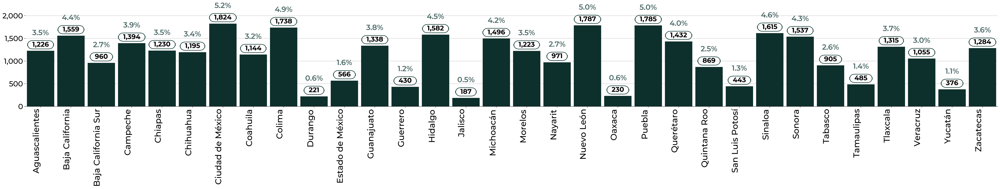

In [3]:
# EXPORTAR: barras_verticales_simples

barras(df0, 
       nombre="barras_verticales", 
       bar_height=0.9, 
       font='Montserrat',
       fontsize_barra=20,
       fontsize_valor_total=20,
       ordenar_por='etiqueta',
       orden='ascendente',
       valor_barra=False, 
       porcentaje_barra=False,
       porcentaje_total=True,
       orientacion='vertical',
       area_min=300
       )

## Barras horizontales

Scour processed file "output/barras_horizontales.svg" in 52 ms: 28716/54150 bytes new/orig -> 53.0%

barras_horizontales_scour.svg:
Done in 108 ms!
28.043 KiB - 25% = 21.037 KiB


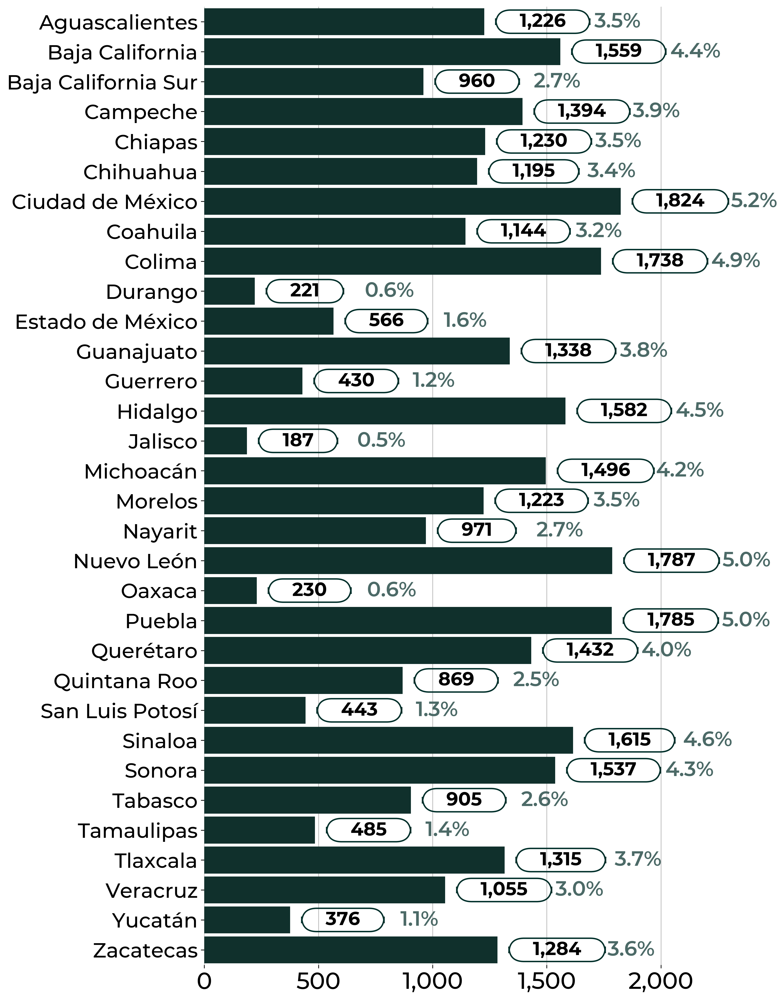

In [4]:
# EXPORTAR: barras_horizontales_simples

barras(df0, 
       nombre="barras_horizontales", 
       bar_height=0.9, 
       font='Montserrat',
       fontsize_barra=15,
       fontsize_valor_total=20,
       ordenar_por='etiqueta',
       orden='ascendente',
       valor_barra=False, 
       porcentaje_barra=False,
       porcentaje_total=True,
       orientacion='horizontal',
       area_min=300,
       separar_por_total=0.05,
       )

## Barras apiladas verticales

In [5]:
data1 = {
    'Año': list(range(2007, 2026)),
    'Movimiento': [174, 234, 412, 852, 835, 680, 863, 869, 789, 970, 1070, 628, 685, 1188, 1639, 1508, 2245, 3131, 487],
    'Sin Movimiento': [185, 247, 400, 1149, 1560, 1418, 1436, 1355, 1271, 1457, 1919, 1797, 2274, 2645, 3117, 2854, 3852, 5846, 3995],
}
df1 = pd.DataFrame(data1)
df1

,Año,Movimiento,Sin Movimiento
0,2007,174,185
1,2008,234,247
2,2009,412,400
3,2010,852,1149
4,2011,835,1560
5,2012,680,1418
6,2013,863,1436
7,2014,869,1355
8,2015,789,1271
9,2016,970,1457


Scour processed file "output/barras_apiladas_verticales.svg" in 45 ms: 26713/46438 bytes new/orig -> 57.5%

barras_apiladas_verticales_scour.svg:
Done in 71 ms!
26.087 KiB - 18.1% = 21.371 KiB


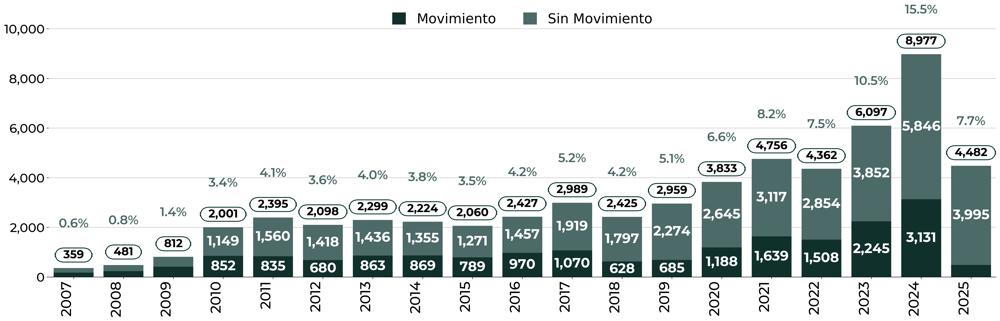

In [6]:
# EXPORTAR: barras_apiladas_verticales

barras(df1, 
       nombre="barras_apiladas_verticales", 
       bar_height=0.8, 
       font='Montserrat',
       valor_barra=True, 
       fontsize_barra=24,
       porcentaje_barra=False, 
       porcentaje_total=True,
       orientacion='vertical',
       ordenar_por='etiqueta',
       orden='ascendente',
       area_min=500,
       leyenda=True
       )

## Barras apiladas horizontales

Scour processed file "output/barras_apiladas_horizontales.svg" in 79 ms: 26487/46644 bytes new/orig -> 56.8%

barras_apiladas_horizontales_scour.svg:
Done in 99 ms!
25.866 KiB - 20.5% = 20.558 KiB


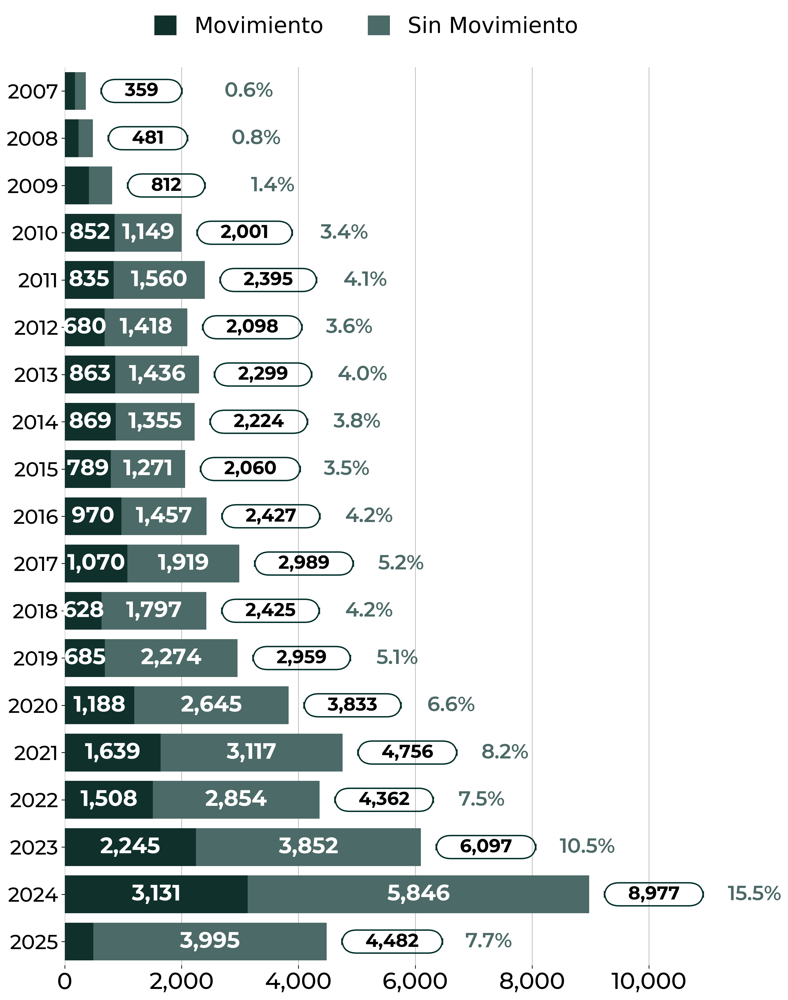

In [7]:
barras(df1, 
       nombre="barras_apiladas_horizontales", 
       bar_height=0.8, 
       font='Montserrat',
       valor_barra=True, 
       fontsize_barra=24,
       porcentaje_barra=False, 
       porcentaje_total=True,
       orientacion='horizontal',
       ordenar_por='etiqueta',
       orden='ascendente',
       area_min=500,
       leyenda=True,
       separar_por_total=0.05,
       )

## Unión de barras

### Gráfica con unión de barras a la izquierda

Scour processed file "output/union_barras_izquierda.svg" in 67 ms: 22759/39102 bytes new/orig -> 58.2%

union_barras_izquierda_scour.svg:
Done in 104 ms!
22.226 KiB - 18.6% = 18.103 KiB


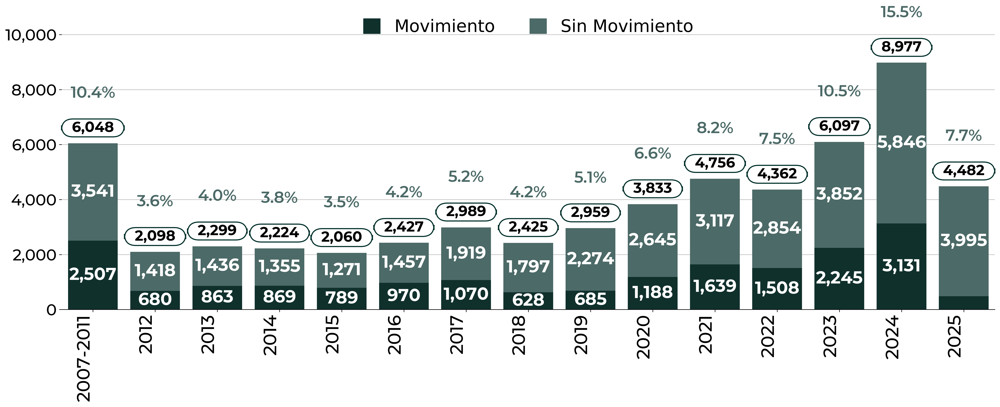

In [8]:
# EXPORTAR: union_barras_izquierda

barras(df1, 
       nombre="union_barras_izquierda", 
       bar_height=0.8, 
       font='Montserrat',
       valor_barra=True, 
       fontsize_barra=24,
       porcentaje_barra=False, 
       porcentaje_total=True,
       orientacion='vertical',
       ordenar_por='etiqueta',
       orden='ascendente',
       area_min=500,
       leyenda=True,
       union_izquierda=5
       )

### Gráfica con unión de barras a la derecha

Scour processed file "output/union_barras_derecha.svg" in 69 ms: 22143/39374 bytes new/orig -> 56.2%

union_barras_derecha_scour.svg:
Done in 92 ms!
21.624 KiB - 17.4% = 17.866 KiB


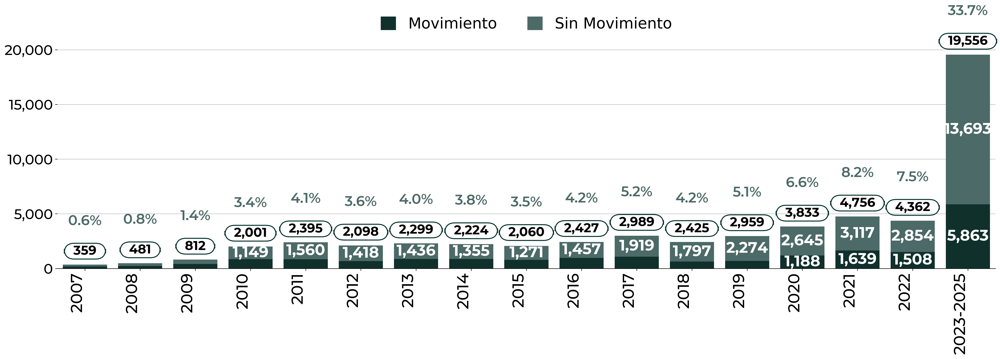

In [9]:
# EXPORTAR: union_barras_derecha

barras(df1, 
       nombre="union_barras_derecha", 
       bar_height=0.8, 
       font='Montserrat',
       valor_barra=True, 
       fontsize_barra=24,
       porcentaje_barra=False, 
       porcentaje_total=True,
       orientacion='vertical',
       ordenar_por='etiqueta',
       orden='ascendente',
       area_min=900,
       leyenda=True,
       union_derecha=3
       )

## Barra de datos previos con puntos suspensivos

In [10]:
# DATAFRAME DE EJEMPLO
data2 = {
    'año': list(range(2005, 2026)),
    'movimiento': [192, 0, 174, 234, 412, 852, 835, 680, 863, 869, 789, 970, 1070, 628, 685, 1188, 1639, 1508, 2245, 3131, 487],
    'sin_movimiento': [313, 0, 185, 247, 400, 1149, 1560, 1418, 1436, 1355, 1271, 1457, 1919, 1797, 2274, 2645, 3117, 2854, 3852, 5846, 3995],
    'porcentaje': ['38%', '0%', '48%', '49%', '51%', '43%', '35%', '32%', '38%', '39%', '38%', '40%', '36%', '26%', '23%', '31%', '34%', '35%', '37%', '35%', '11%']
}

df2_ = pd.DataFrame(data2)
df2 = df2_.iloc[2:].reset_index(drop=True)
df2

,año,movimiento,sin_movimiento,porcentaje
0,2007,174,185,48%
1,2008,234,247,49%
2,2009,412,400,51%
3,2010,852,1149,43%
4,2011,835,1560,35%
5,2012,680,1418,32%
6,2013,863,1436,38%
7,2014,869,1355,39%
8,2015,789,1271,38%
9,2016,970,1457,40%


Scour processed file "output/barra_previa.svg" in 44 ms: 13799/24555 bytes new/orig -> 56.2%

barra_previa_scour.svg:
Done in 86 ms!
13.476 KiB - 16.3% = 11.272 KiB


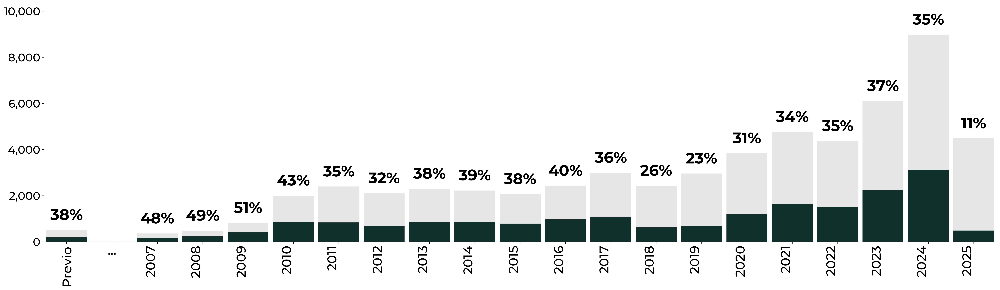

In [11]:
# EXPORTAR: barra_previa

barras(df2, 
       nombre="barra_previa", 
       bar_height=0.9, 
       font='Montserrat',
       fontsize_valor_total=30,
       ordenar_por='etiqueta',
       orden='ascendente',
       valor_barra=False, 
       porcentaje_barra=False,
       porcentaje_total=False,
       orientacion='vertical',
       quitar_capsula=True,
       agregar_datos=[(pd.Timestamp(2005, 1, 1), "Previo", (192, 313, "38%"))],
       asignar_etiquetas='porcentaje',
       grillas=False,
       paleta_colores=["#10302C", "#E6E6E6"]
       )

## Sustitución de etiquetas

Scour processed file "output/sustitucion_etiquetas.svg" in 82 ms: 22234/39472 bytes new/orig -> 56.3%

sustitucion_etiquetas_scour.svg:
Done in 100 ms!
21.713 KiB - 17.4% = 17.935 KiB


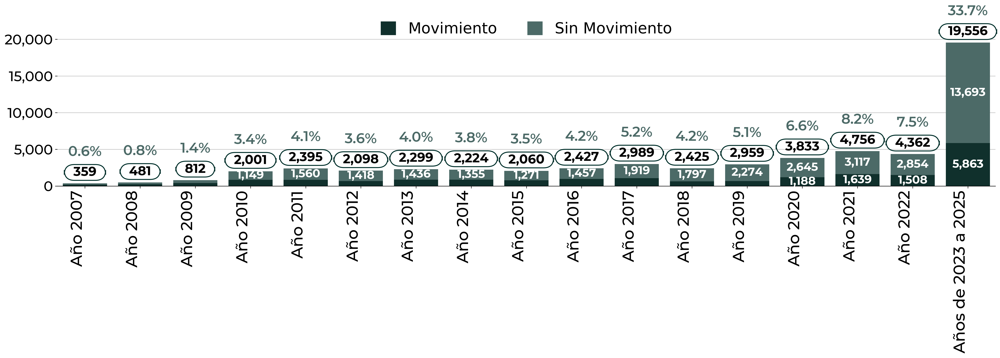

In [12]:
# EXPORTAR: sustitucion_etiquetas

etiquetas_nuevas = ['Año 2007', 'Año 2008', 'Año 2009', 'Año 2010', 'Año 2011',
                    'Año 2012', 'Año 2013', 'Año 2014', 'Año 2015', 'Año 2016',
                    'Año 2017', 'Año 2018', 'Año 2019', 'Año 2020', 'Año 2021',
                    'Año 2022', 'Años de 2023 a 2025']

barras(df1, 
       nombre="sustitucion_etiquetas", 
       bar_height=0.8, 
       font='Montserrat',
       valor_barra=True, 
       fontsize_barra=18,
       porcentaje_barra=False, 
       porcentaje_total=True,
       orientacion='vertical',
       ordenar_por='etiqueta',
       orden='ascendente',
       area_min=900,
       leyenda=True,
       union_derecha=3,
       sustituir_etiquetas=etiquetas_nuevas
       )

## Reducir o aumentar el espacio entre barras

Scour processed file "output/espacio_entre_barras.svg" in 70 ms: 22606/39323 bytes new/orig -> 57.5%

espacio_entre_barras_scour.svg:
Done in 108 ms!
22.076 KiB - 20.8% = 17.487 KiB


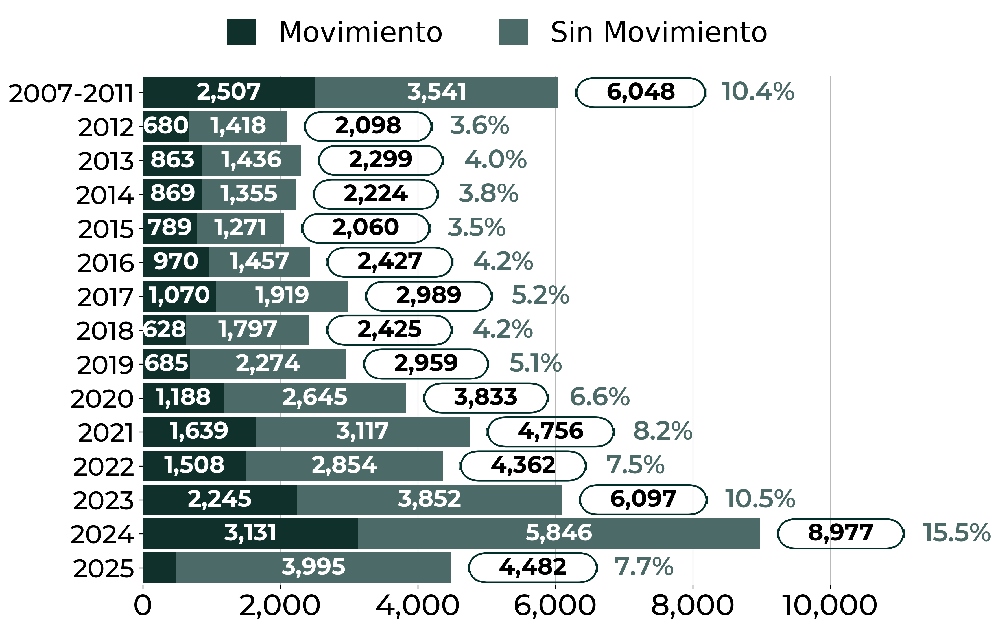

In [13]:
# EXPORTAR: espacio_entre_barras

# Se ajusta la separación de las barras mediante la variación de: 
# bar_height
# aumenta_alto_fig
# aumenta_ancho_fig
# aumenta_sep_leyenda

barras(df1, 
       nombre="espacio_entre_barras", 
       bar_height=0.9, 
       font='Montserrat',
       valor_barra=True, 
       fontsize_barra=20,
       porcentaje_barra=False, 
       porcentaje_total=True,
       orientacion='horizontal',
       ordenar_por='etiqueta',
       orden='ascendente',
       area_min=500,
       leyenda=True,
       union_izquierda=5,
       separar_por_total=0.05,
       aumenta_alto_fig=-7.5,
       aumenta_sep_leyenda=0.08
       )

## Porecentaje al inicio de las barras

Scour processed file "output/porcentaje_inicio.svg" in 74 ms: 22804/36024 bytes new/orig -> 63.3%

porcentaje_inicio_scour.svg:
Done in 109 ms!
22.27 KiB - 22.7% = 17.209 KiB


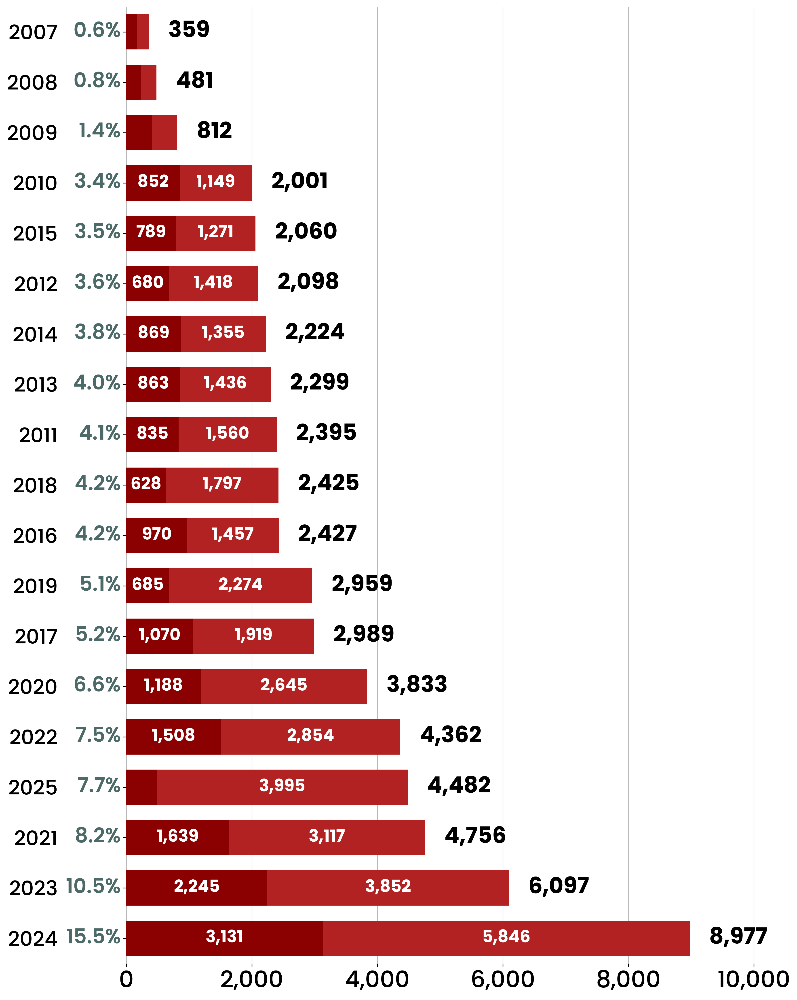

In [14]:
# EXPORTAR: porcentaje_inicio

barras(df1, 
       nombre="porcentaje_inicio", 
       bar_height=0.7, 
       font='Poppins',
       fontsize_barra=18,
       fontsize_valor_total=24,
       valor_barra=True, 
       valor_total=True,
       porcentaje_barra=False, 
       porcentaje_total=False,
       orientacion='horizontal',
       ordenar_por='valor',
       orden='ascendente',
       quitar_capsula=True,
       porcentaje_total_inicio=True,
       espacio_inicio=70,
       paleta_colores = ["#8B0000", "#B22222", "#CD5C5C", "#F08080"],
       area_min=350
       )

## Resaltar etiquetas

In [15]:
# DataFrame con los 32 estados de la República Mexicana y varias columnas de ejemplo

estados_mexico = [
    'Aguascalientes', 'Baja California', 'Baja California Sur', 'Campeche', 'Chiapas',
    'Chihuahua', 'Ciudad de México', 'Coahuila', 'Colima', 'Durango', 'Estado de México',
    'Guanajuato', 'Guerrero', 'Hidalgo', 'Jalisco', 'Michoacán', 'Morelos', 'Nayarit',
    'Nuevo León', 'Oaxaca', 'Puebla', 'Querétaro', 'Quintana Roo', 'San Luis Potosí',
    'Sinaloa', 'Sonora', 'Tabasco', 'Tamaulipas', 'Tlaxcala', 'Veracruz', 'Yucatán', 'Zacatecas'
]

np.random.seed(42)
data_estados_3 = {
    'estado': estados_mexico,
    'movimiento': np.random.randint(100, 2000, size=32),
    'sin_movimiento': np.random.randint(100, 3000, size=32),
    'pendiente': np.random.randint(10, 300, size=32),
    'cancelado': np.random.randint(5, 50, size=32)
}

df3 = pd.DataFrame(data_estados_3)
df3

,estado,movimiento,sin_movimiento,pendiente,cancelado
0,Aguascalientes,1226,559,101,29
1,Baja California,1559,121,273,11
2,Baja California Sur,960,2400,44,13
3,Campeche,1394,847,215,28
4,Chiapas,1230,574,90,5
5,Chihuahua,1195,1182,59,48
6,Ciudad de México,1824,2658,11,12
7,Coahuila,1144,2147,63,28
8,Colima,1738,2847,115,15
9,Durango,221,1075,269,21


Scour processed file "output/resaltar_etiquetas.svg" in 146 ms: 42336/71061 bytes new/orig -> 59.6%

resaltar_etiquetas_scour.svg:
Done in 207 ms!
41.344 KiB - 20.2% = 33.009 KiB


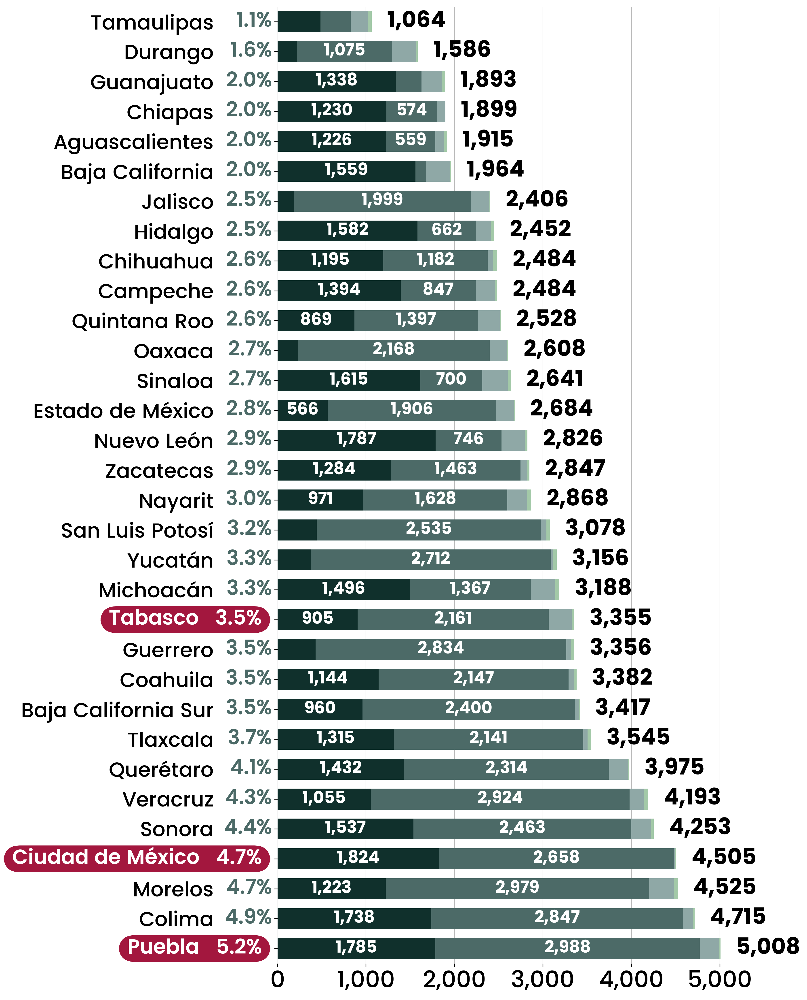

In [16]:
# EXPORTAR: resaltar_etiquetas

barras(df3, 
       nombre="resaltar_etiquetas", 
       bar_height=0.7, 
       font='Poppins',
       fontsize_barra=18,
       fontsize_valor_total=24,
       valor_barra=True, 
       valor_total=True,
       porcentaje_barra=False, 
       porcentaje_total=False,
       orientacion='horizontal',
       ordenar_por='valor',
       orden='ascendente',
       quitar_capsula=True,
       porcentaje_total_inicio=True,
       espacio_inicio=65,
       area_min=350,
       resaltar_etiquetas=["Puebla", "Ciudad de México", "Tabasco"]
       )

## Barras de porcentaje

In [17]:
# Ejemplo de dataframe con porcentajes

np.random.seed(0)
n_filas4 = 20
n_cols4 = 3

# Generar fechas aleatorias para la primera columna
fechas4 = pd.to_datetime(
    np.random.choice(pd.date_range("2015-01-01", "2025-12-31"), n_filas4, replace=False)
)

valores4 = np.random.rand(n_filas4, n_cols4)
valores4 = valores4 / valores4.sum(axis=1, keepdims=True) * 100

# Ajustar la última columna para que la suma sea exactamente 100
valores4 = np.round(valores4, 1)
for i in range(n_filas4):
    suma4 = valores4[i, :-1].sum()
    valores4[i, -1] = 100 - suma4

df4 = pd.DataFrame(valores4, columns=['A', 'B', 'C'])
df4.insert(0, 'fecha', fechas4)
df4

,fecha,A,B,C
0,2024-04-23,44.1,33.3,22.6
1,2019-02-22,36.4,31.9,31.7
2,2018-01-21,45.8,3.7,50.5
3,2019-06-04,40.4,24.2,35.4
4,2021-11-24,43.8,51.9,4.3
5,2015-08-06,20.5,59.2,20.3
6,2020-04-02,25.4,31.8,42.8
7,2016-06-29,21.0,6.2,72.8
8,2025-02-22,43.1,46.6,10.3
9,2018-04-18,33.0,31.8,35.2


Scour processed file "output/barras_porcentaje.svg" in 64 ms: 21245/35184 bytes new/orig -> 60.4%

barras_porcentaje_scour.svg:
Done in 88 ms!
20.747 KiB - 18.5% = 16.901 KiB


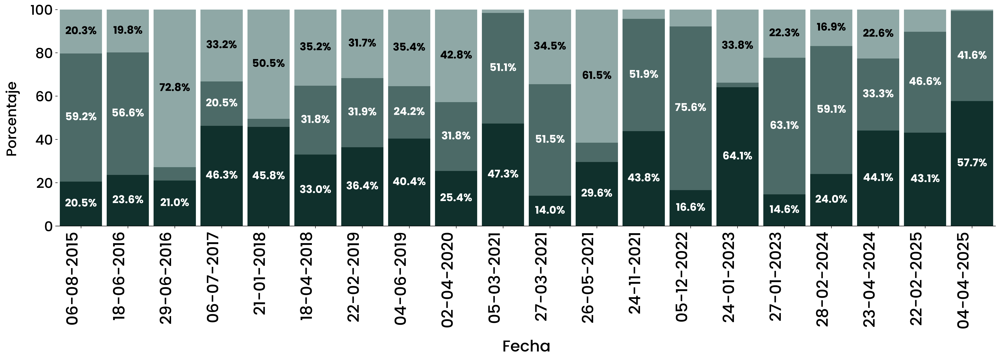

In [18]:
# EXPORTAR: barras_porcentaje

barras(df4,
       nombre="barras_porcentaje", 
       bar_height=0.9, 
       font='Poppins',
       fontsize_barra=17,
       valor_barra=False,
       valor_total=False,
       porcentaje_barra=True, 
       porcentaje_total=False,
       orientacion='vertical',
       ordenar_por='etiqueta',
       orden='ascendente',
       grillas=False,
       area_min=10,
       y_limits=(0, 100),
       nombre_eje_x="Fecha",
       nombre_eje_y="Porcentaje"
       )

## Barras apiladas con ceros

Scour processed file "output/barras_apiladas_con_ceros.svg" in 19 ms: 7792/13372 bytes new/orig -> 58.3%

barras_apiladas_con_ceros_scour.svg:
Done in 59 ms!
7.609 KiB - 19.1% = 6.158 KiB


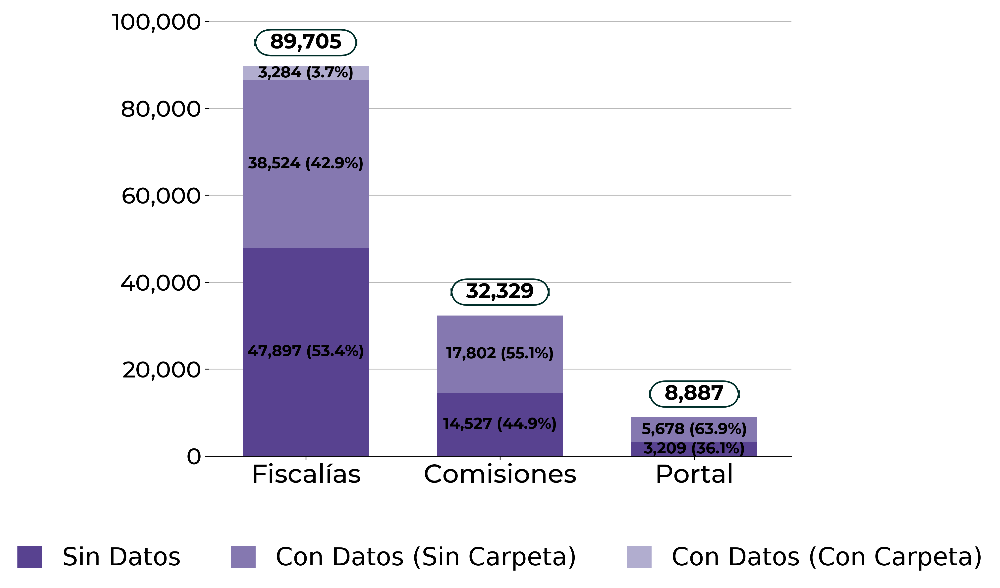

In [19]:
# EXPORTAR: barras_apiladas_con_ceros

df5 = pd.DataFrame({
    'Instituciones': ['Fiscalías', 'Comisiones', 'Portal'],
    'Sin Datos': [47897, 14527, 3209],
    'Con Datos (Sin Carpeta)': [38524, 17802, 5678],
    'Con Datos (Con Carpeta)': [3284, 0, 0]
})
df5

barras(df5, 
       nombre="barras_apiladas_con_ceros", 
       bar_height=0.65, 
       font='Montserrat',
       fontsize_barra=15,
       fontsize_valor_total=20,
       ordenar_por=False,
       orden='ascendente',
       valor_barra=True, 
       porcentaje_barra=True,
       porcentaje_total=False,
       orientacion='vertical',
       area_min=5,
       porcentaje_abajo=False,
       leyenda=True,
       orientacion_etiqueta_x='horizontal',
       paleta_colores=["#584290", "#8578B0", "#B1ADCF"],
       posicion_leyenda='abajo',
       color_valor_barra='#000000'
       )

In [20]:
# Crear el DataFrame con años
df6 = pd.DataFrame({
    'Año': [2019, 2020, 2021, 2022],
    'Positivo 1': [5, 3, 4, 2],
    'Positivo 2': [2, 1, 3, 1],
    'Negativo 1': [-2, -4, -1, -3],
    'Negativo 2': [-1, -2, -2, -1]
})
df6

,Año,Positivo 1,Positivo 2,Negativo 1,Negativo 2
0,2019,5,2,-2,-1
1,2020,3,1,-4,-2
2,2021,4,3,-1,-2
3,2022,2,1,-3,-1


Scour processed file "output/barras_apiladas_con_ceros.svg" in 36 ms: 10938/17977 bytes new/orig -> 60.8%

barras_apiladas_con_ceros_scour.svg:
Done in 67 ms!
10.682 KiB - 18.8% = 8.676 KiB


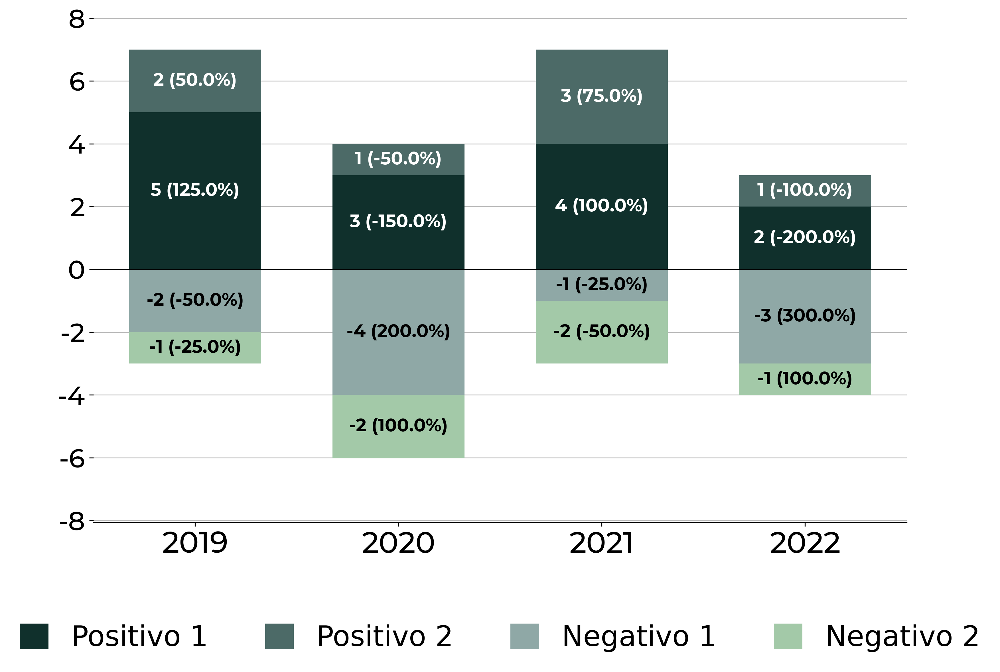

In [23]:
barras(df6, 
       nombre="barras_apiladas_con_ceros", 
       bar_height=0.65, 
       font='Montserrat',
       fontsize_barra=15,
       fontsize_valor_total=20,
       ordenar_por=False,
       orden='ascendente',
       valor_barra=True, 
       valor_total=False,
       porcentaje_barra=True,
       porcentaje_total=False,
       orientacion='vertical',
       area_min=0,
       porcentaje_abajo=False,
       leyenda=True,
       orientacion_etiqueta_x='horizontal',
       posicion_leyenda='abajo',
       )